In [1]:
"""
Author: Davy Neven
Licensed under the CC BY-NC 4.0 license (https://creativecommons.org/licenses/by-nc/4.0/)
"""
import os
import shutil
from matplotlib import pyplot as plt
from tqdm import tqdm
import math

import torch
import torch.nn as nn
import train_match_config

from datasets import get_dataset
from models import get_model, ERFNet_Semantic_Original
from utils.utils import AverageMeter, Logger, Visualizer  # for CVPPP

torch.backends.cudnn.benchmark = True

args = train_match_config.get_args()

# set device
device = torch.device("cuda:0" if args['cuda'] else "cpu")

# train dataloader (student)
args['train_dataset']['batch_size'] = 1
train_dataset = get_dataset(
    args['train_dataset']['name'], args['train_dataset']['kwargs'])
train_dataset_it = torch.utils.data.DataLoader(
    train_dataset, batch_size=args['train_dataset']['batch_size'], shuffle=False, drop_last=True,
    num_workers=args['train_dataset']['workers'], pin_memory=True if args['cuda'] else False)

# val dataloader (student)
val_dataset = get_dataset(
    args['val_dataset']['name'], args['val_dataset']['kwargs'])
val_dataset_it = torch.utils.data.DataLoader(
    val_dataset, batch_size=args['val_dataset']['batch_size'], shuffle=False, drop_last=True,
    num_workers=args['train_dataset']['workers'], pin_memory=True if args['cuda'] else False)

# image files:  81
# label(bg/plant/disease) files:  81
# image(crop) files:  81
# label(crop) files:  81
Corn Dataset(Teacher) created [train]
# image files:  10
# label(bg/plant/disease) files:  10
Corn Dataset(Teacher) created [val]


In [2]:
import random
import torchvision.transforms.functional as F

def crop_roi(image, label, class_idx=2, ratio=0.2, search_range=128):
    '''image: (3, H, W)
       label: (H, W)'''

    h_bound = image.shape[1] - 1
    w_bound = image.shape[2] - 1

    ths = int((label == class_idx).sum() * ratio)

    heights, widths = torch.where(label == class_idx)
    heights = torch.sort(heights).values
    widths = torch.sort(widths).values

    cnt = 0

    cond = True
    while cond:

        h = random.randint(int(len((heights)) * 0.15), int(len((heights)) * 0.85))
        w = random.randint(int(len((widths)) * 0.15), int(len((widths)) * 0.85))

        h_point = heights[h]
        w_point = widths[w]

        cond_h = True
        while cond_h:
            h_minus = random.randint(0, search_range)
            h_plus = random.randint(0, search_range)

            if h_point - h_minus >= 0 and h_point + h_plus <= h_bound:
                # print('cond_h')
                cond_h = False

        cond_w = True
        while cond_w:
            w_minus = random.randint(0, 128)
            w_plus = random.randint(0, 128)

            if w_point - w_minus >= 0 and w_point + w_plus <= w_bound:
                # print('cond_w')
                cond_w = False

        h_min = h_point - h_minus;
        h_max = h_point + h_plus
        w_min = w_point - w_minus;
        w_max = w_point + w_plus

        image_crop = image[:, h_min:h_max, w_min:w_max]
        label_crop = label[h_min:h_max, w_min:w_max]

        if (label_crop == class_idx).sum() > ths:
            # print('cond')
            cond = False
        else:
            del image_crop, label_crop

    return image_crop, label_crop

  0%|                                                                                           | 0/81 [00:00<?, ?it/s]

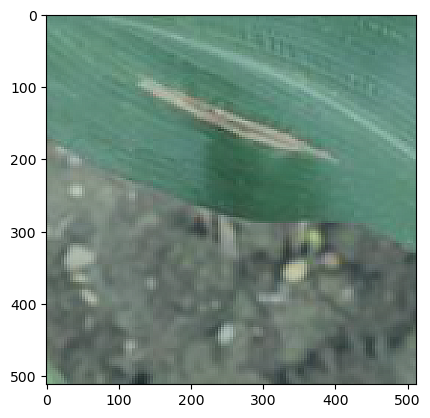

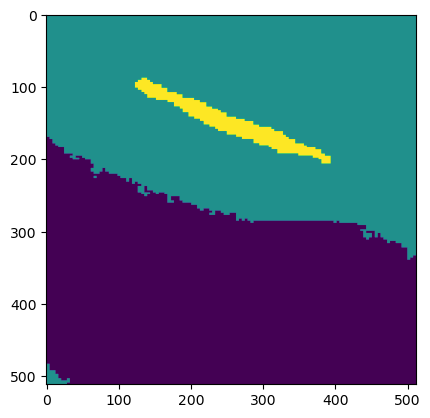

  1%|█                                                                                  | 1/81 [00:00<00:33,  2.41it/s]

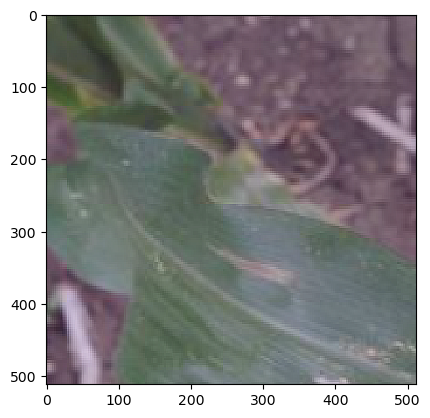

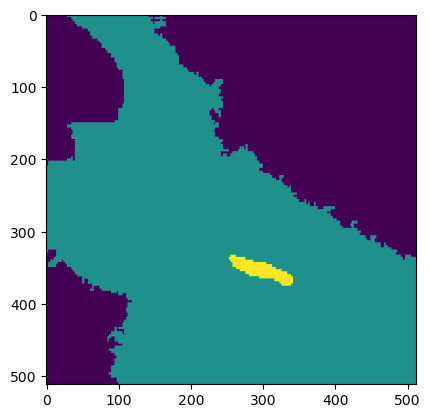

  2%|██                                                                                 | 2/81 [00:00<00:26,  2.93it/s]

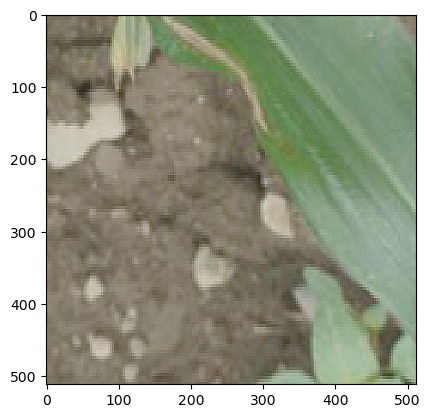

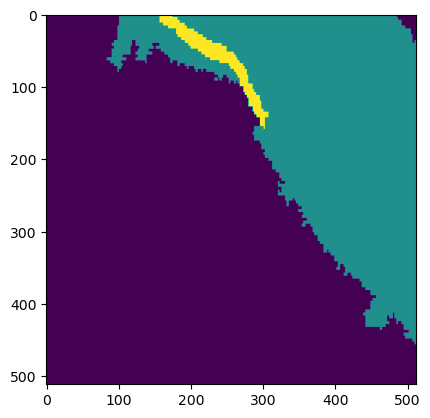

  4%|███                                                                                | 3/81 [00:00<00:22,  3.40it/s]

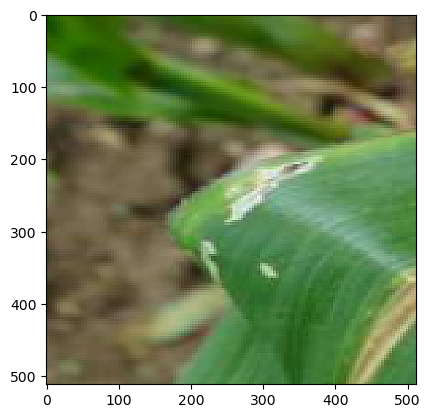

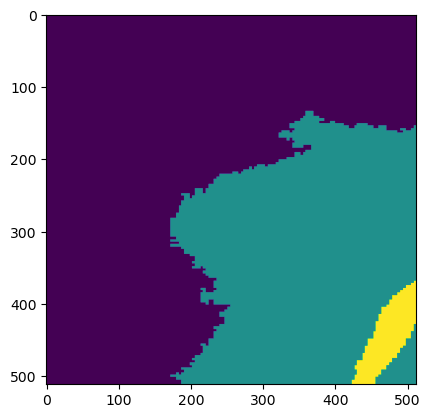

  5%|████                                                                               | 4/81 [00:01<00:21,  3.61it/s]

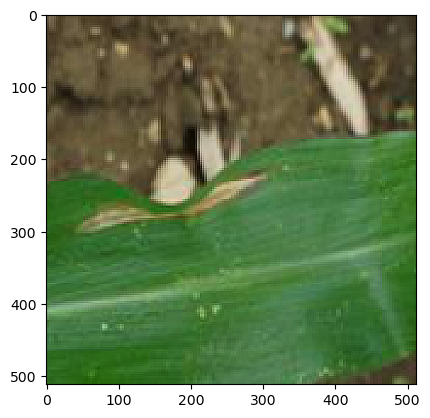

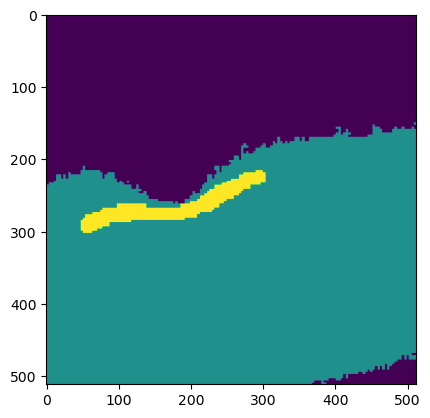

  6%|█████                                                                              | 5/81 [00:01<00:20,  3.66it/s]

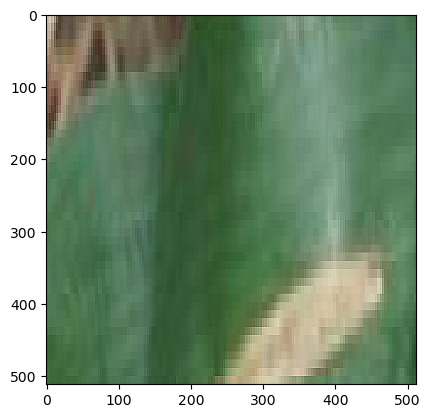

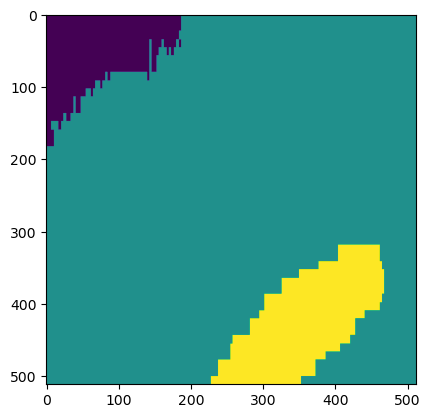

  7%|██████▏                                                                            | 6/81 [00:01<00:18,  4.06it/s]

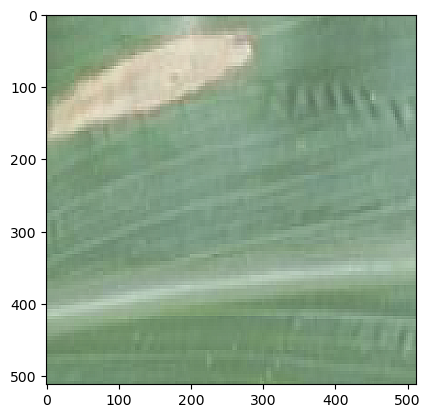

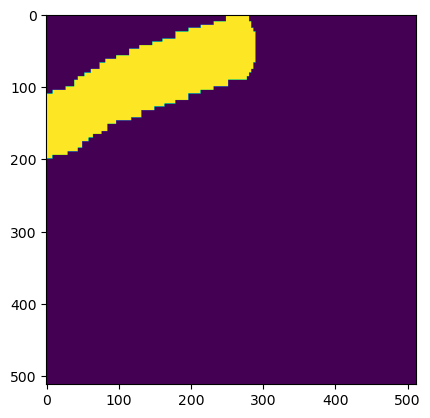

  9%|███████▏                                                                           | 7/81 [00:01<00:17,  4.22it/s]

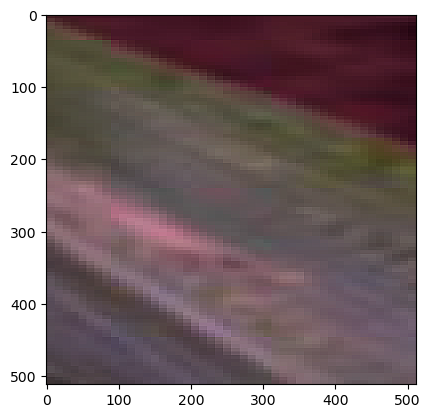

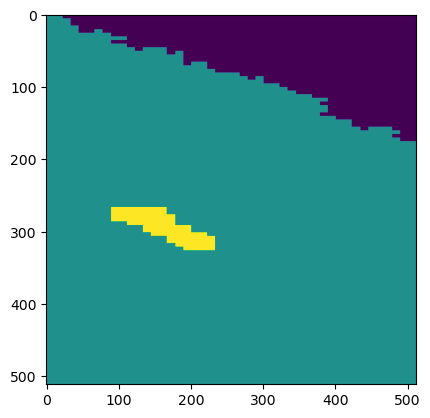

 10%|████████▏                                                                          | 8/81 [00:02<00:16,  4.35it/s]

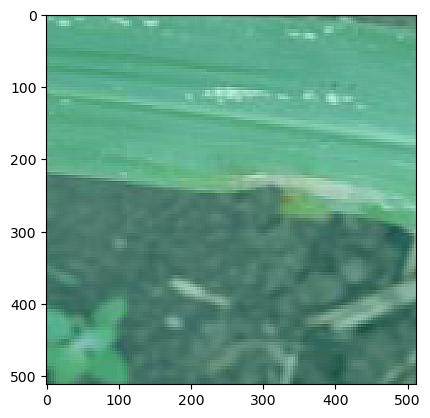

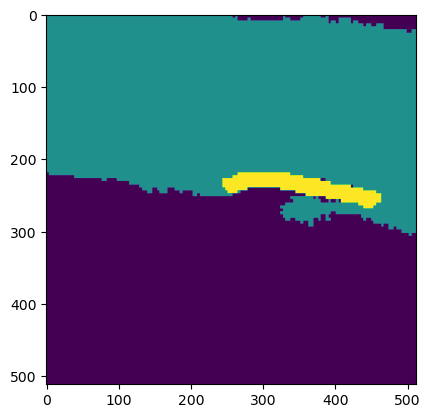

 11%|█████████▏                                                                         | 9/81 [00:02<00:17,  4.16it/s]

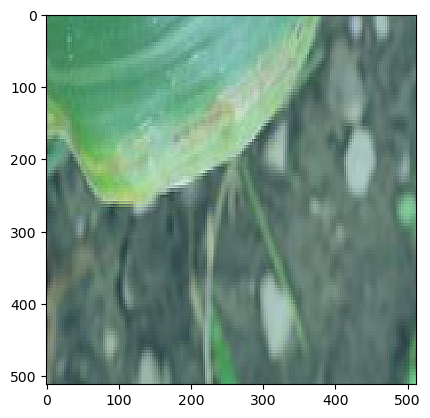

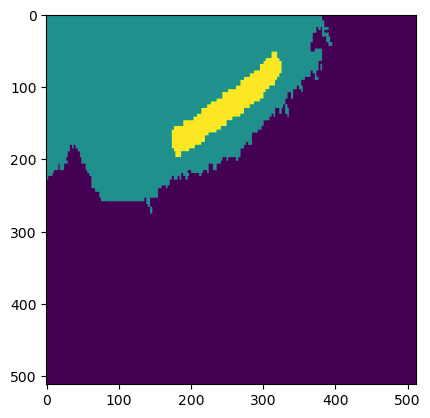

 12%|██████████                                                                        | 10/81 [00:02<00:17,  4.06it/s]

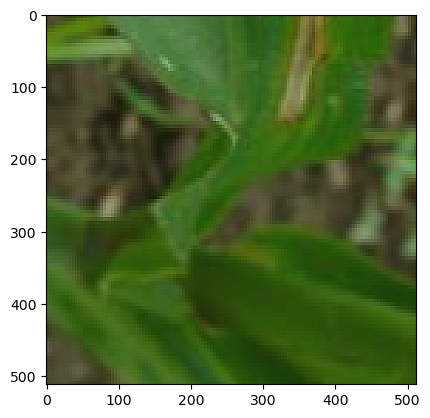

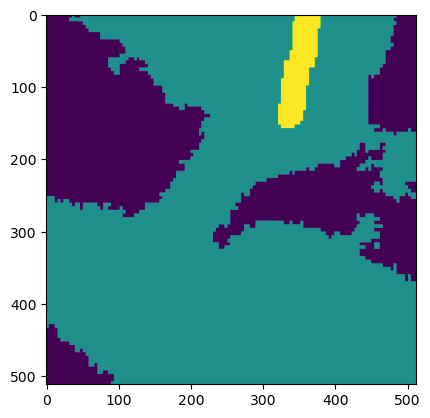

 14%|███████████▏                                                                      | 11/81 [00:02<00:17,  3.97it/s]

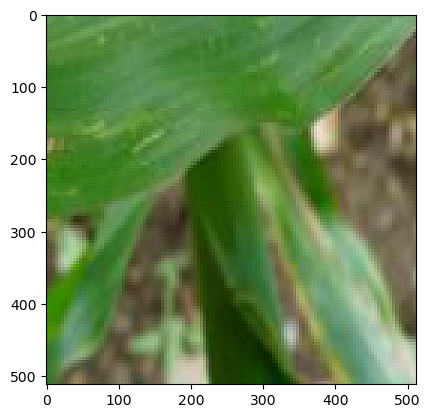

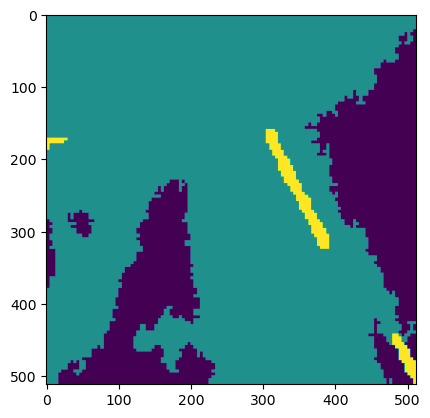

 15%|████████████▏                                                                     | 12/81 [00:03<00:18,  3.63it/s]

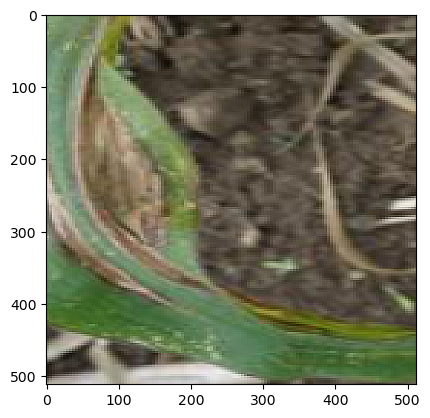

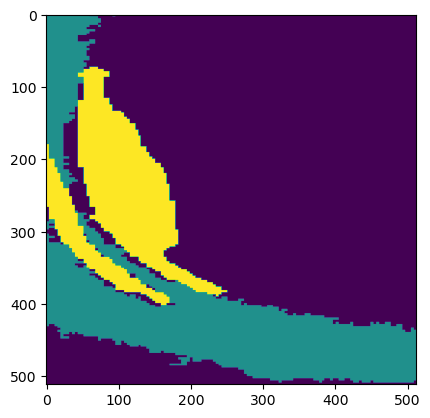

 16%|█████████████▏                                                                    | 13/81 [00:03<00:17,  3.80it/s]

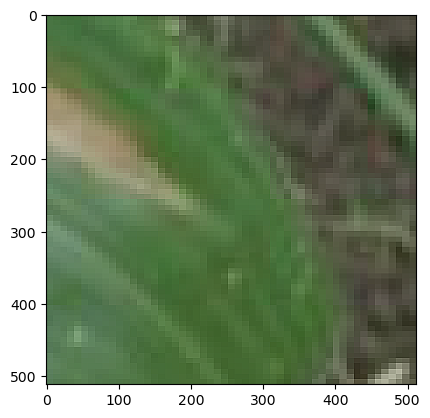

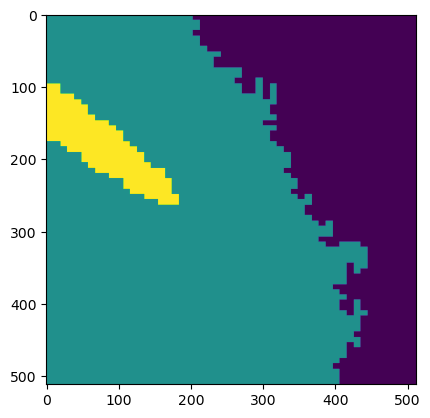

 17%|██████████████▏                                                                   | 14/81 [00:03<00:16,  4.15it/s]

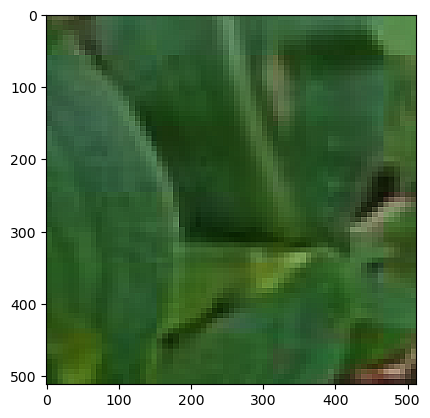

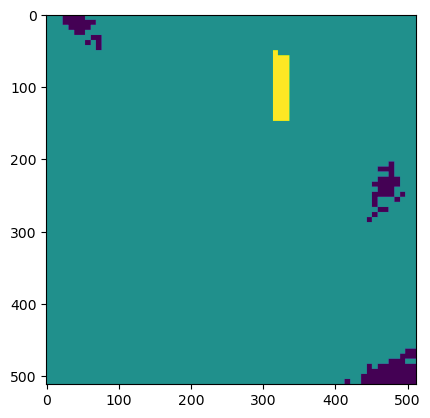

 19%|███████████████▏                                                                  | 15/81 [00:03<00:15,  4.36it/s]

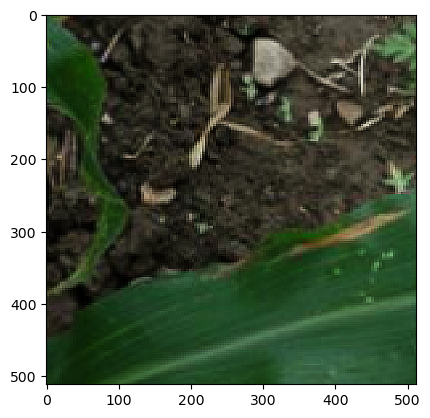

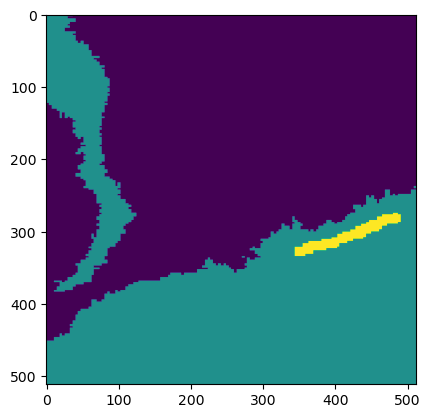

 20%|████████████████▏                                                                 | 16/81 [00:04<00:15,  4.23it/s]

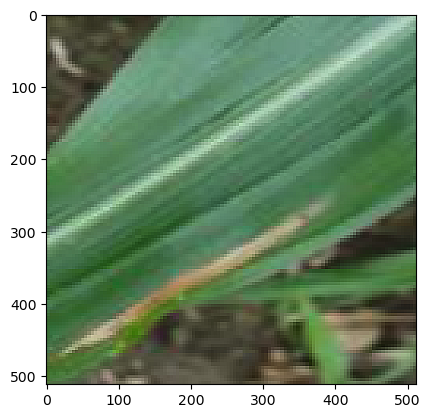

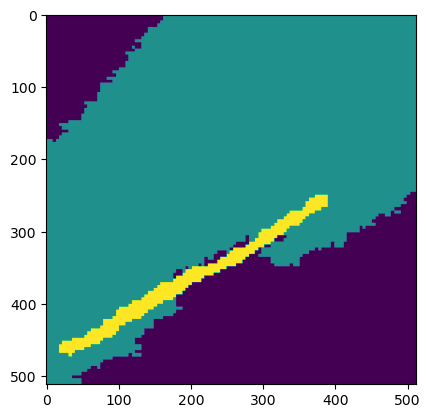

 21%|█████████████████▏                                                                | 17/81 [00:04<00:14,  4.27it/s]

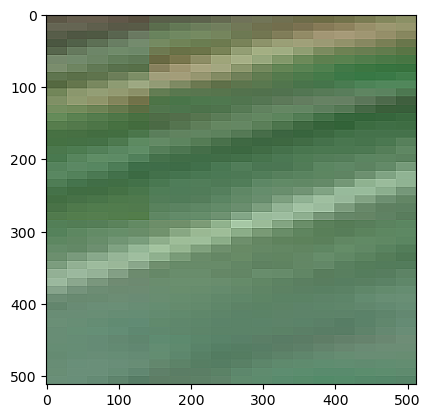

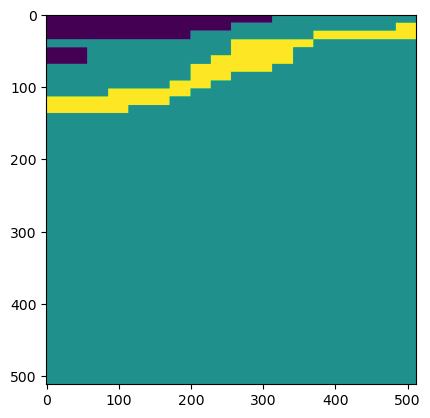

 22%|██████████████████▏                                                               | 18/81 [00:04<00:13,  4.54it/s]

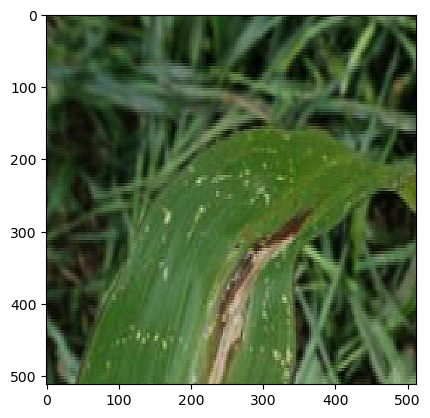

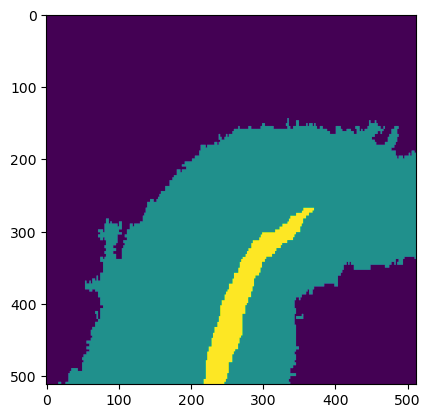

 23%|███████████████████▏                                                              | 19/81 [00:04<00:14,  4.41it/s]

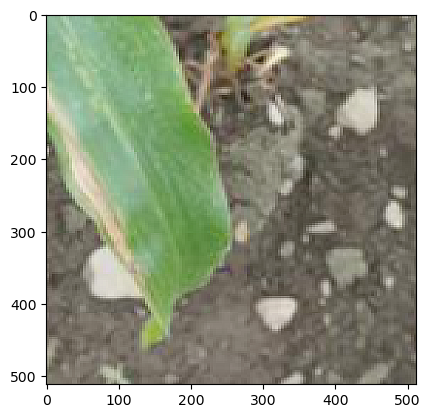

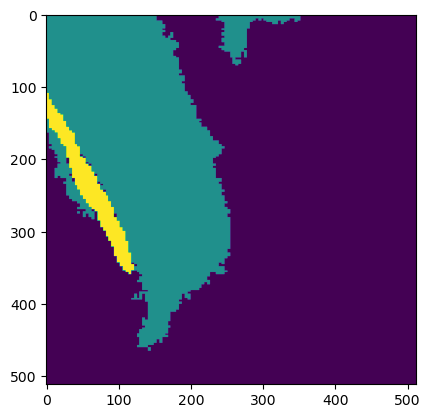

 25%|████████████████████▏                                                             | 20/81 [00:04<00:13,  4.39it/s]

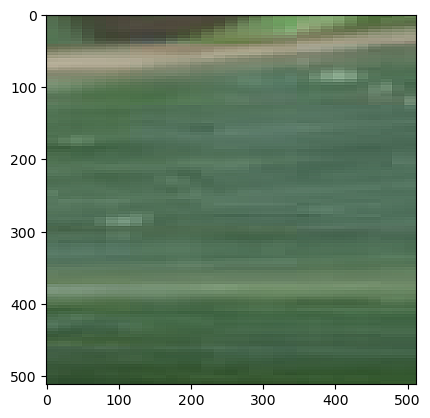

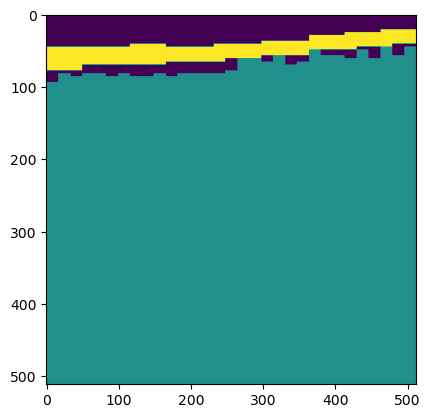

 26%|█████████████████████▎                                                            | 21/81 [00:05<00:13,  4.49it/s]

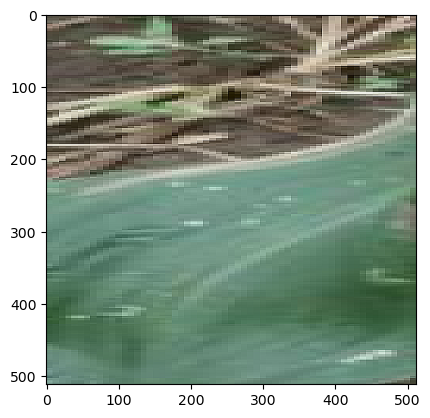

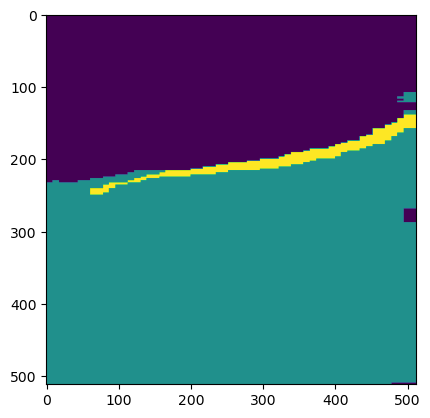

 27%|██████████████████████▎                                                           | 22/81 [00:05<00:12,  4.55it/s]

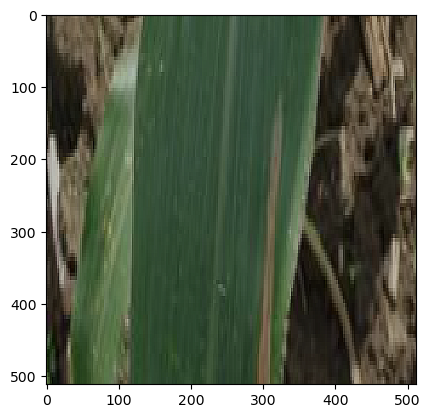

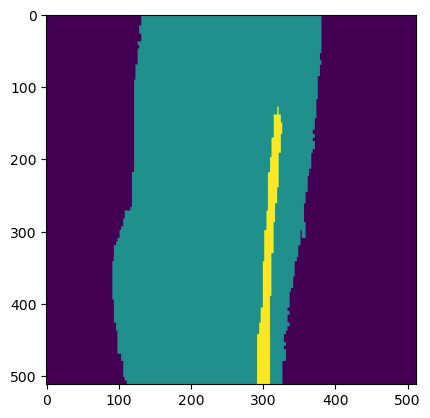

 28%|███████████████████████▎                                                          | 23/81 [00:05<00:14,  4.07it/s]

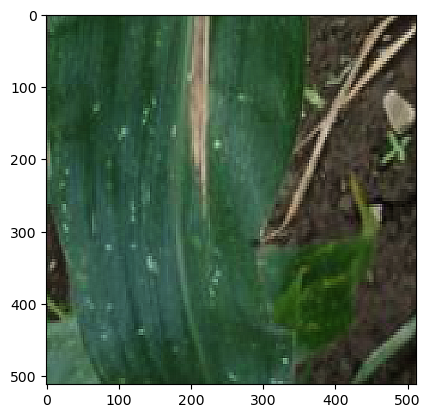

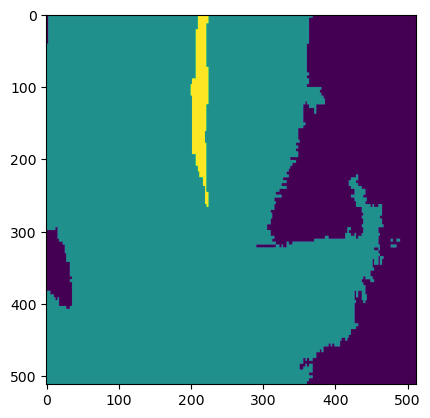

 30%|████████████████████████▎                                                         | 24/81 [00:05<00:14,  3.99it/s]

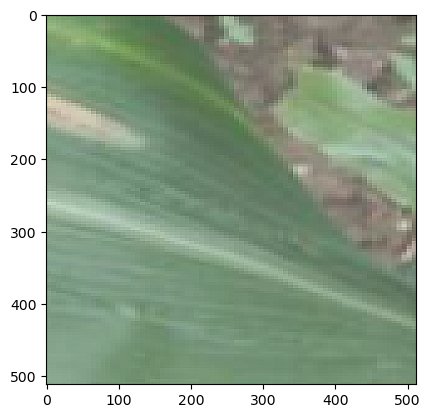

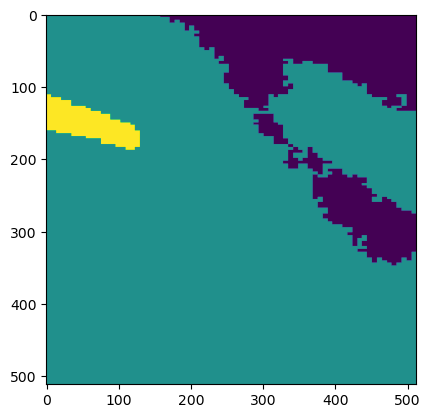

 31%|█████████████████████████▎                                                        | 25/81 [00:06<00:13,  4.19it/s]

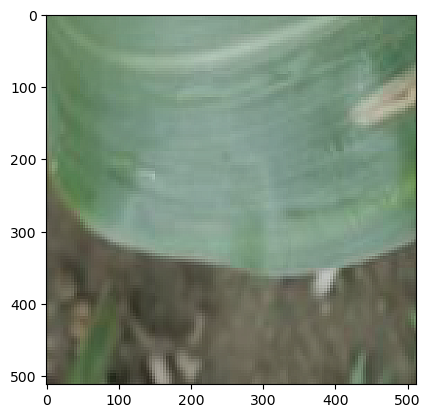

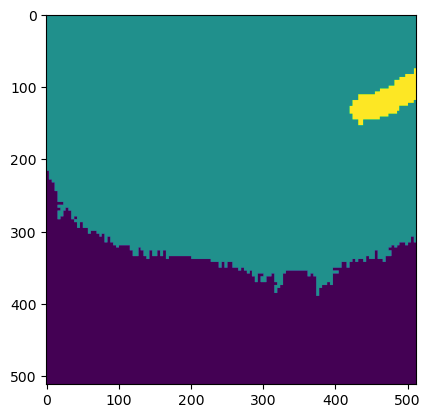

 32%|██████████████████████████▎                                                       | 26/81 [00:06<00:13,  4.22it/s]

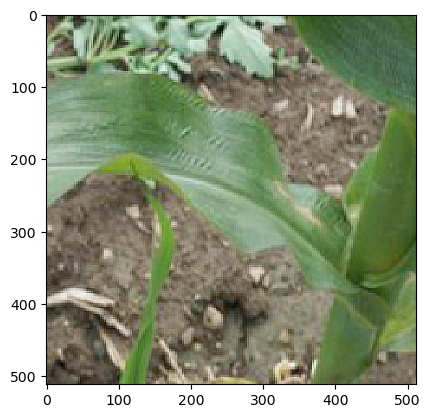

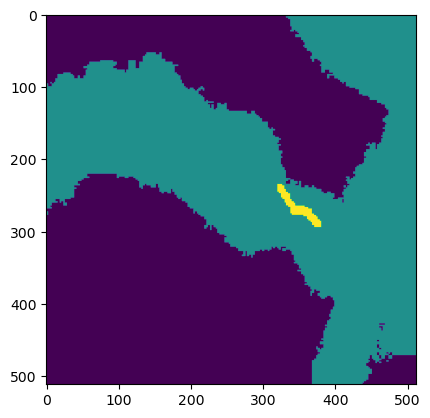

 33%|███████████████████████████▎                                                      | 27/81 [00:06<00:12,  4.21it/s]

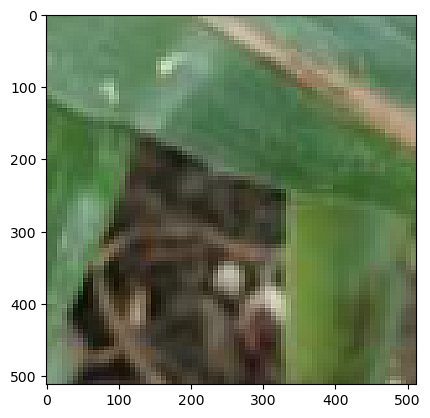

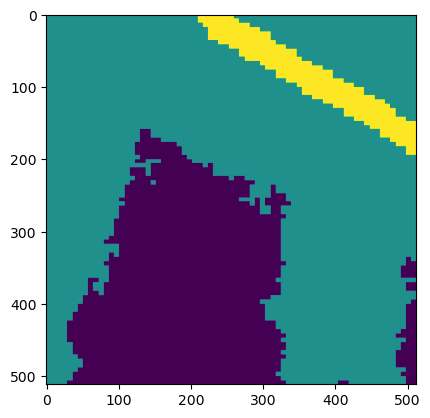

 35%|████████████████████████████▎                                                     | 28/81 [00:06<00:12,  4.37it/s]

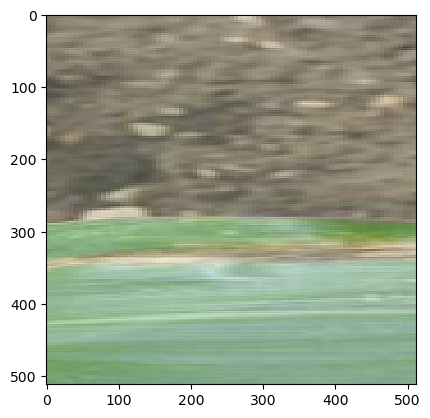

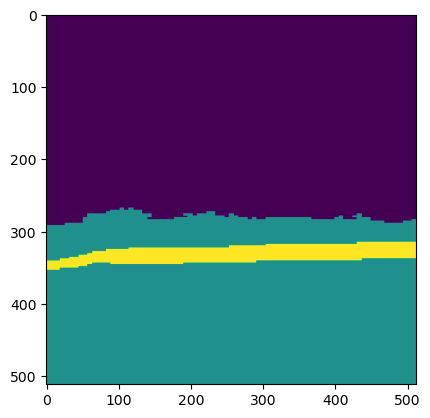

 36%|█████████████████████████████▎                                                    | 29/81 [00:07<00:11,  4.37it/s]

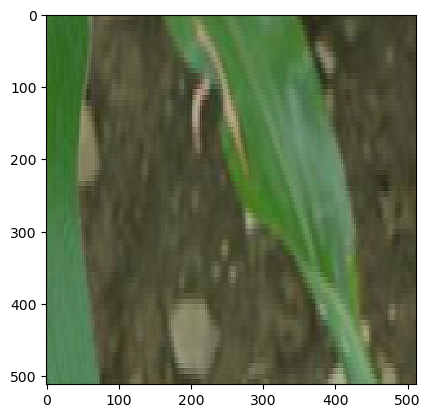

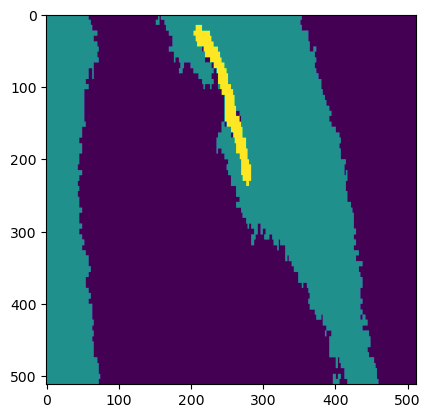

 37%|██████████████████████████████▎                                                   | 30/81 [00:07<00:11,  4.41it/s]

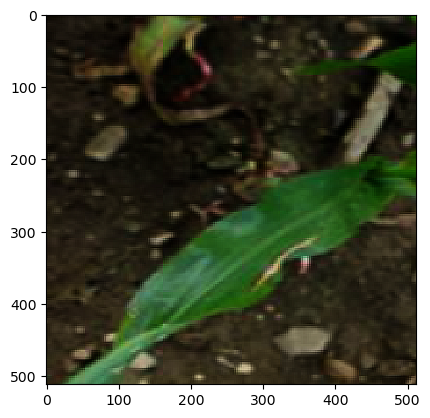

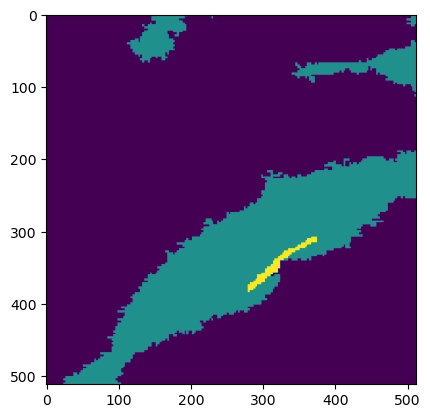

 38%|███████████████████████████████▍                                                  | 31/81 [00:07<00:11,  4.30it/s]

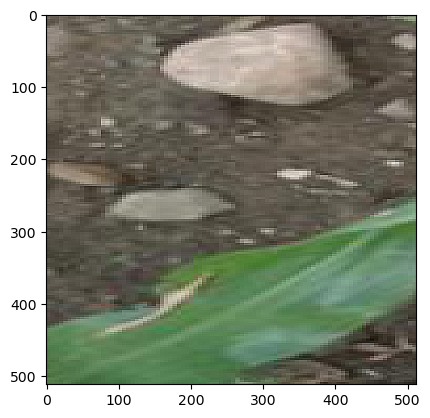

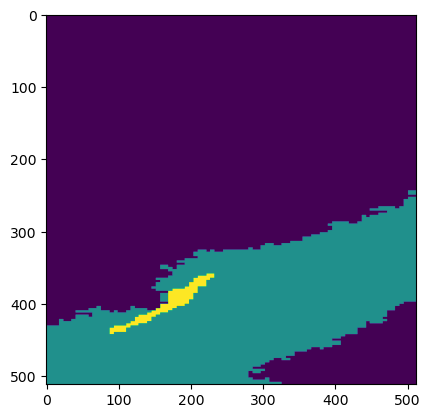

 40%|████████████████████████████████▍                                                 | 32/81 [00:07<00:11,  4.35it/s]

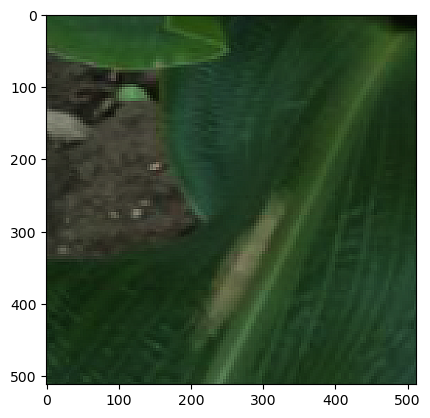

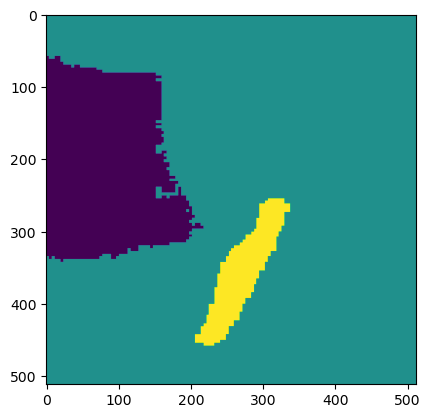

 41%|█████████████████████████████████▍                                                | 33/81 [00:08<00:12,  3.97it/s]

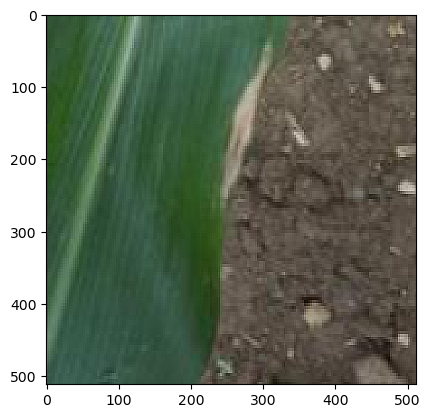

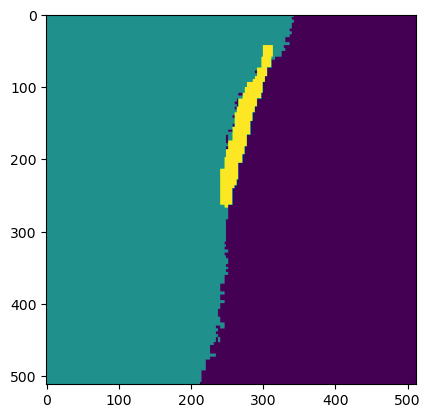

 42%|██████████████████████████████████▍                                               | 34/81 [00:08<00:11,  4.12it/s]

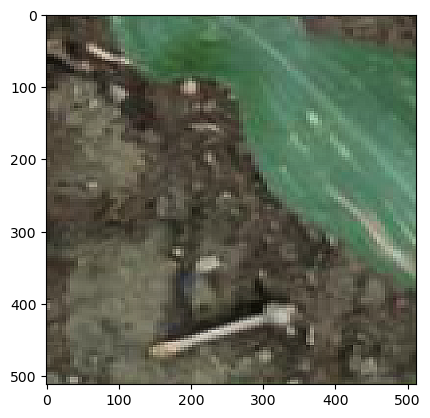

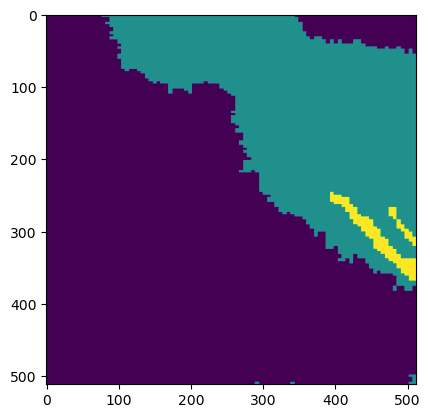

 43%|███████████████████████████████████▍                                              | 35/81 [00:08<00:10,  4.21it/s]

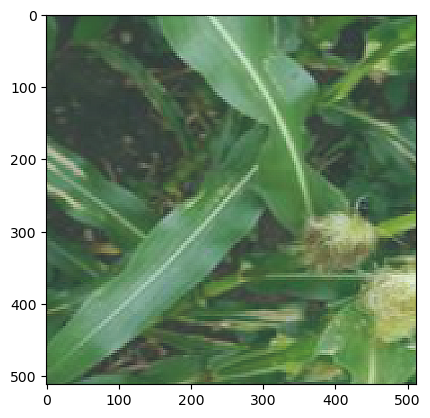

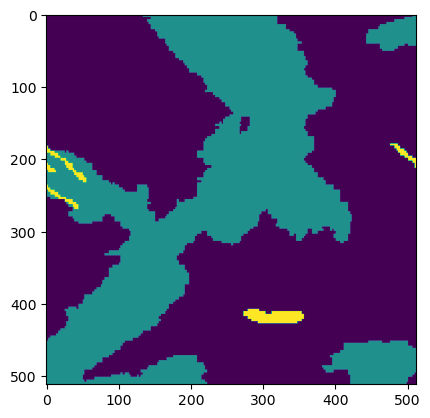

 44%|████████████████████████████████████▍                                             | 36/81 [00:08<00:10,  4.19it/s]

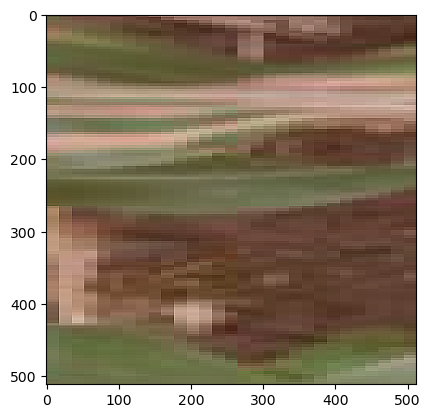

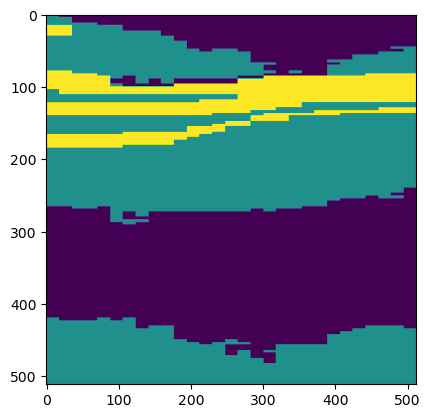

 46%|█████████████████████████████████████▍                                            | 37/81 [00:08<00:10,  4.29it/s]

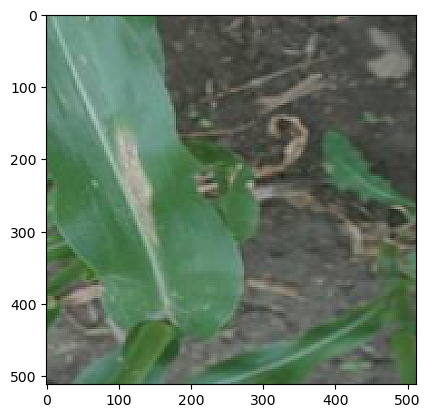

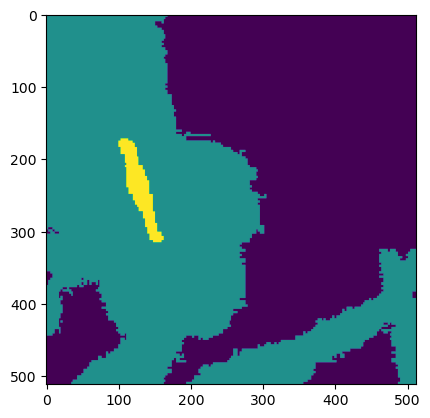

 47%|██████████████████████████████████████▍                                           | 38/81 [00:09<00:10,  4.19it/s]

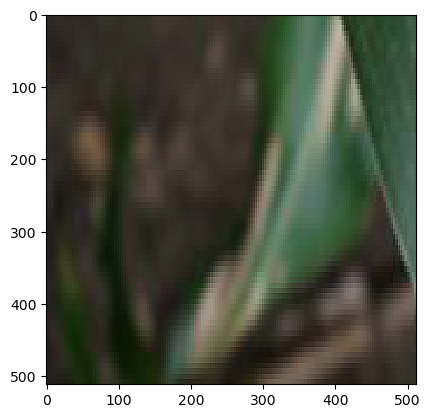

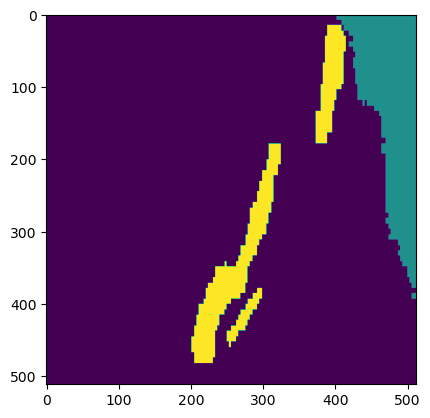

 48%|███████████████████████████████████████▍                                          | 39/81 [00:09<00:09,  4.37it/s]

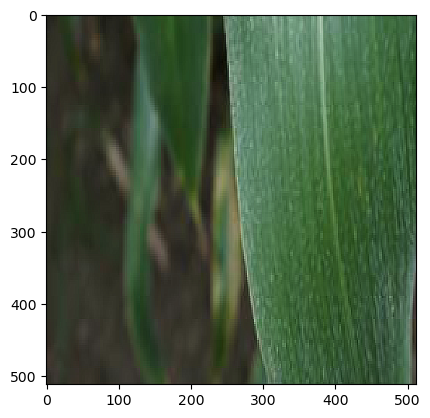

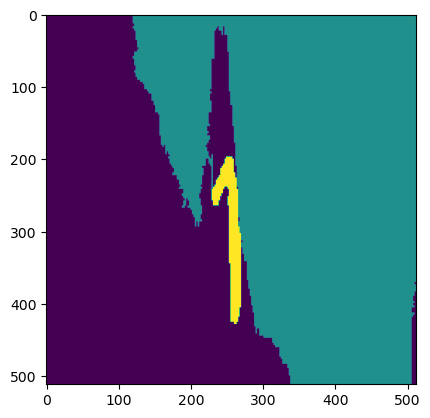

 49%|████████████████████████████████████████▍                                         | 40/81 [00:09<00:09,  4.37it/s]

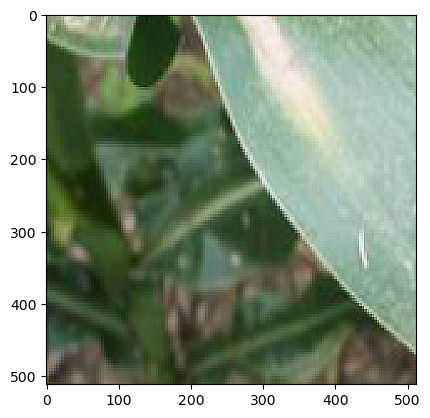

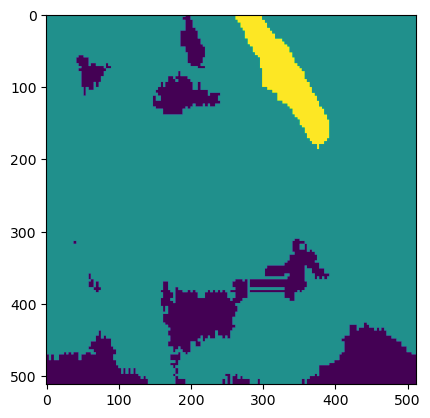

 51%|█████████████████████████████████████████▌                                        | 41/81 [00:09<00:09,  4.13it/s]

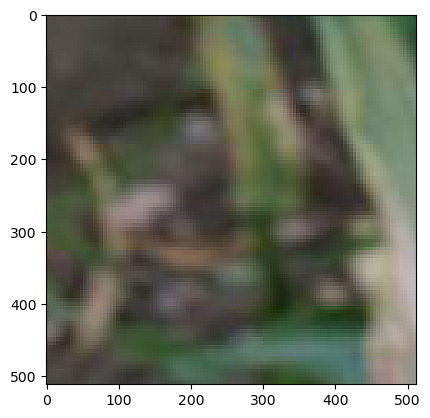

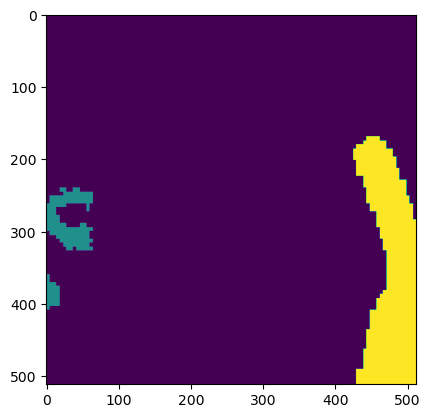

 52%|██████████████████████████████████████████▌                                       | 42/81 [00:10<00:09,  4.20it/s]

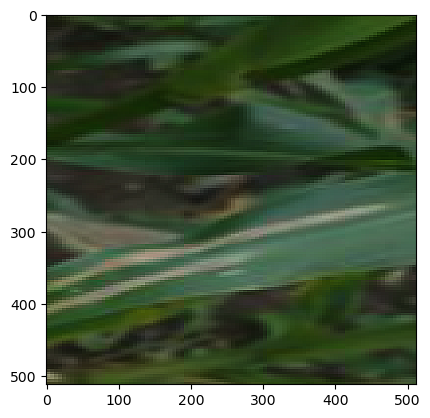

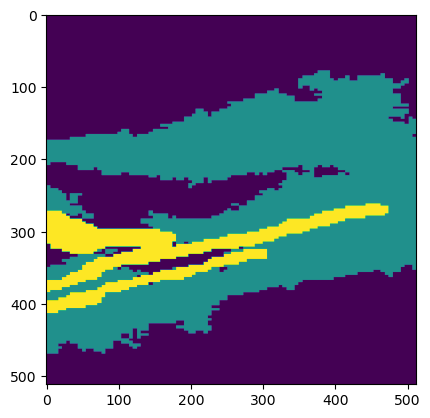

 53%|███████████████████████████████████████████▌                                      | 43/81 [00:10<00:09,  4.05it/s]

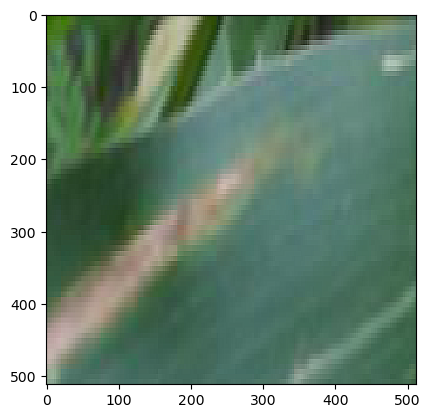

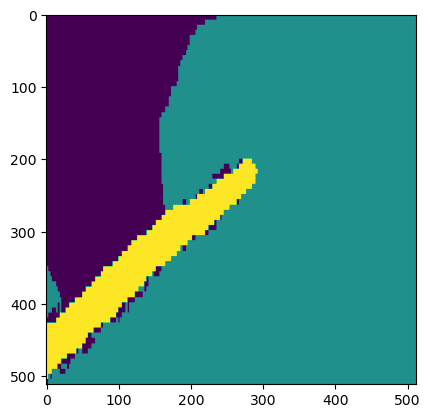

 54%|████████████████████████████████████████████▌                                     | 44/81 [00:10<00:09,  3.88it/s]

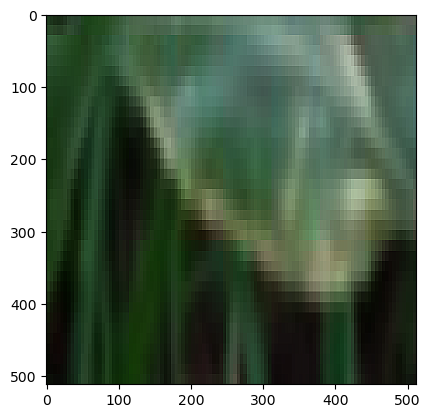

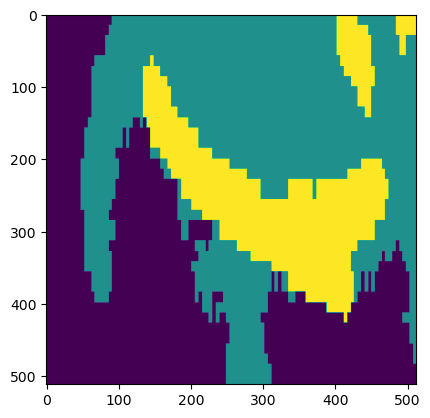

 56%|█████████████████████████████████████████████▌                                    | 45/81 [00:10<00:08,  4.13it/s]

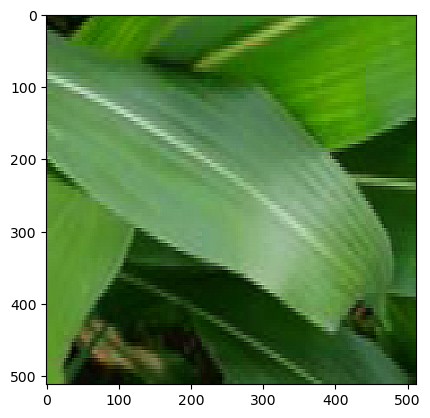

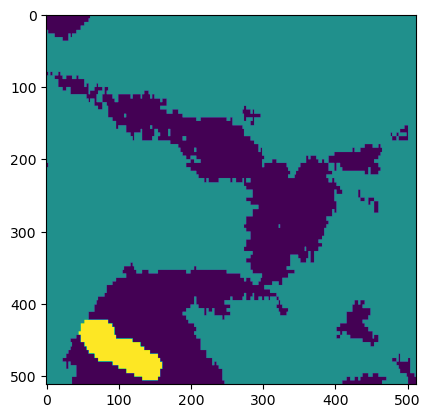

 57%|██████████████████████████████████████████████▌                                   | 46/81 [00:11<00:08,  4.20it/s]

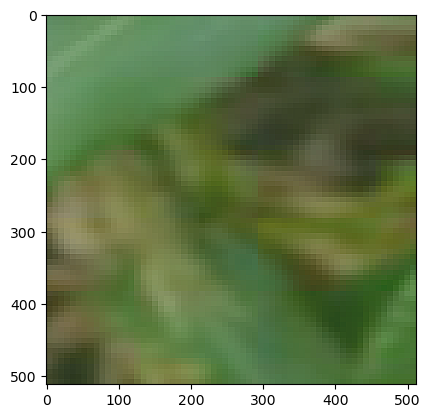

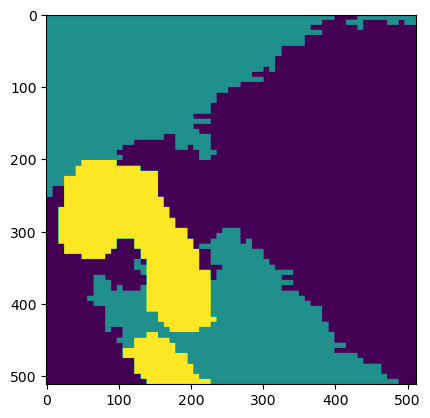

 58%|███████████████████████████████████████████████▌                                  | 47/81 [00:11<00:07,  4.39it/s]

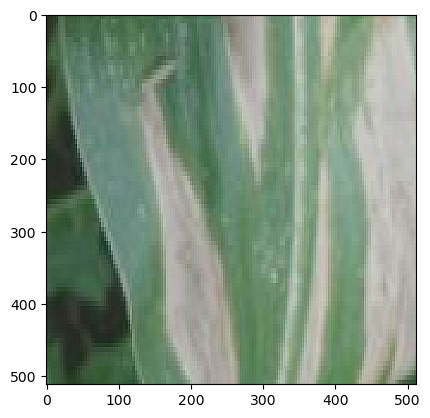

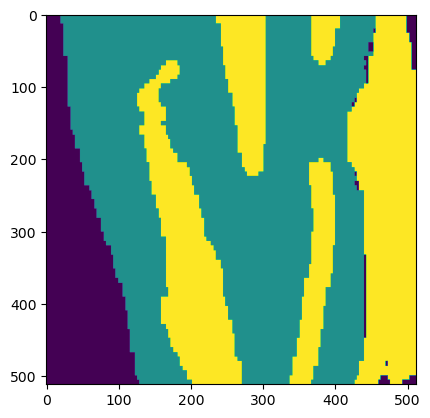

 59%|████████████████████████████████████████████████▌                                 | 48/81 [00:11<00:07,  4.25it/s]

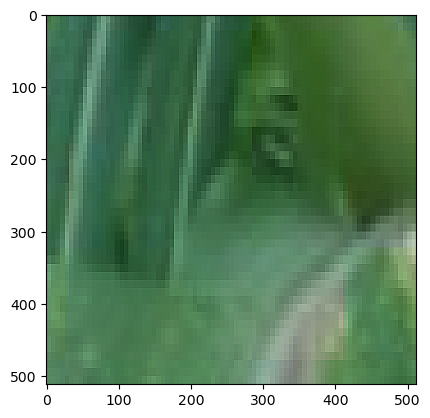

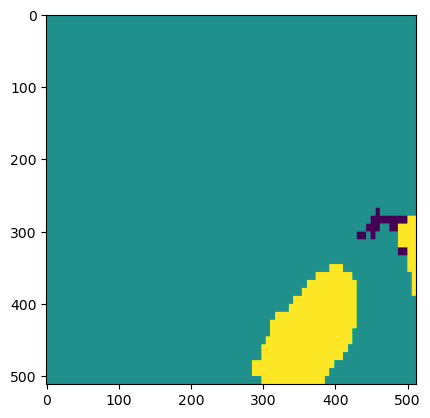

 60%|█████████████████████████████████████████████████▌                                | 49/81 [00:11<00:07,  4.37it/s]

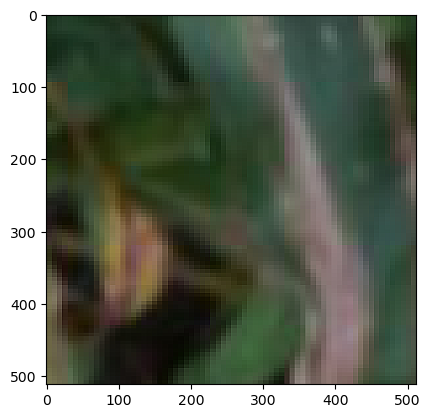

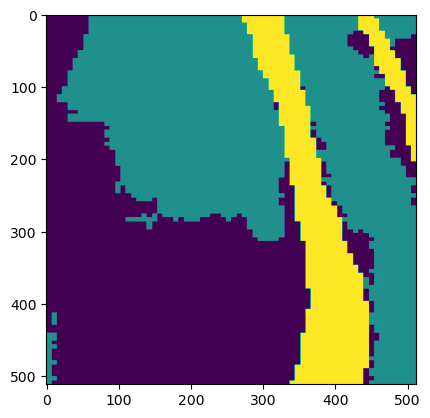

 62%|██████████████████████████████████████████████████▌                               | 50/81 [00:12<00:06,  4.46it/s]

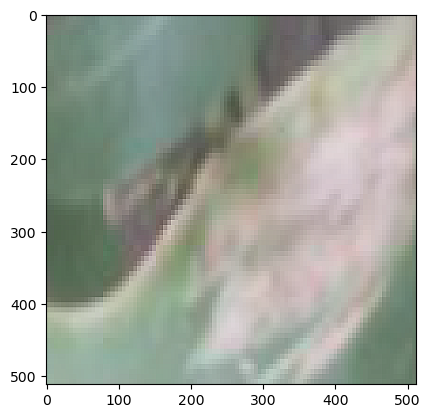

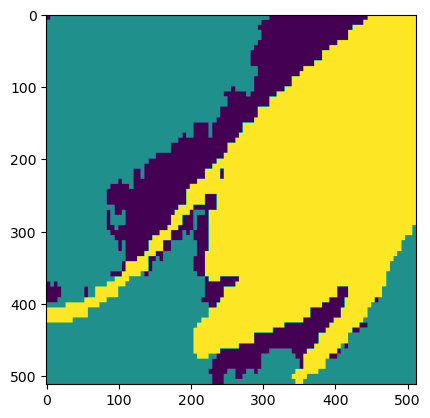

 63%|███████████████████████████████████████████████████▋                              | 51/81 [00:12<00:06,  4.52it/s]

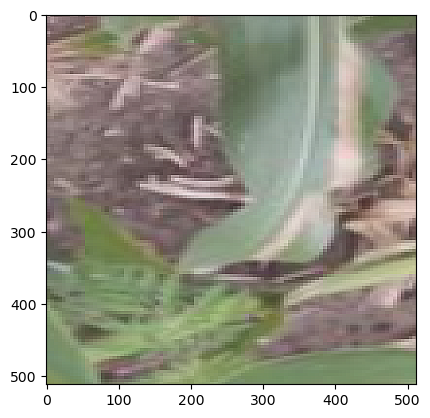

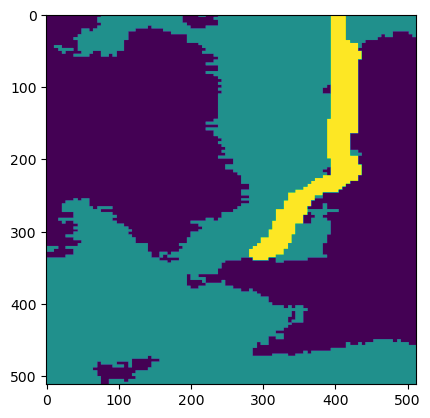

 64%|████████████████████████████████████████████████████▋                             | 52/81 [00:12<00:06,  4.43it/s]

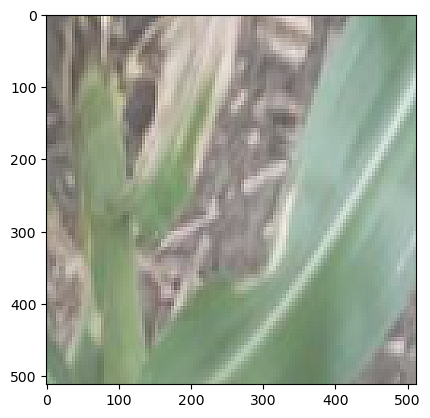

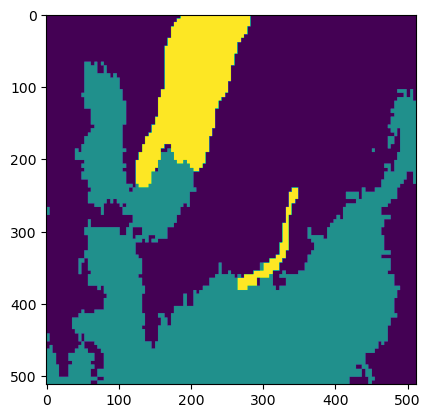

 65%|█████████████████████████████████████████████████████▋                            | 53/81 [00:12<00:06,  4.42it/s]

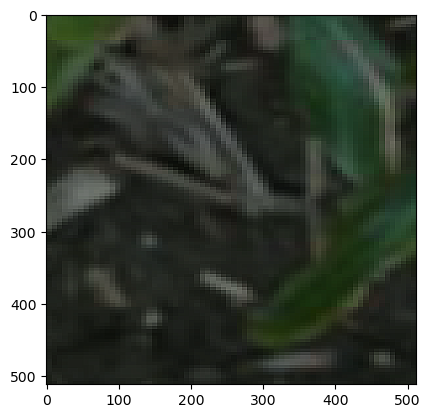

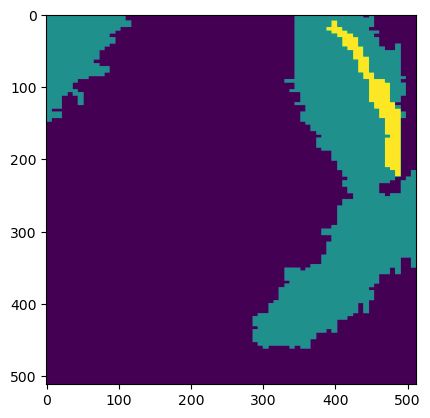

 67%|██████████████████████████████████████████████████████▋                           | 54/81 [00:13<00:06,  4.03it/s]

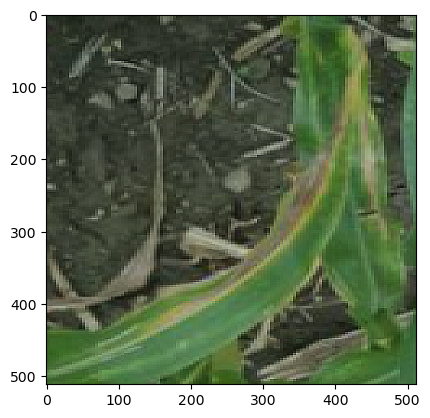

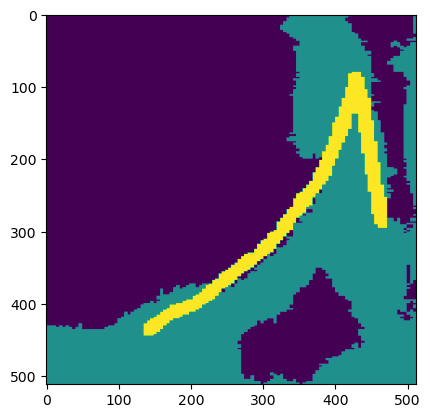

 68%|███████████████████████████████████████████████████████▋                          | 55/81 [00:13<00:06,  3.92it/s]

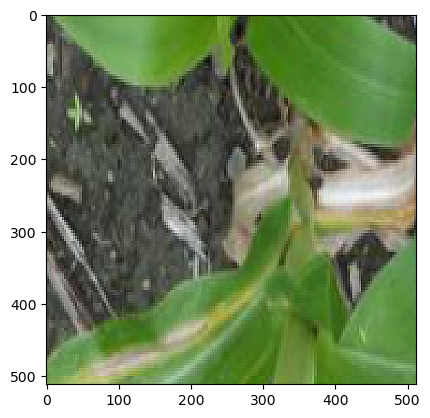

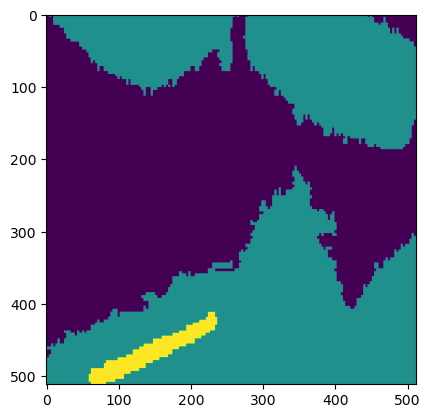

 69%|████████████████████████████████████████████████████████▋                         | 56/81 [00:13<00:06,  3.94it/s]

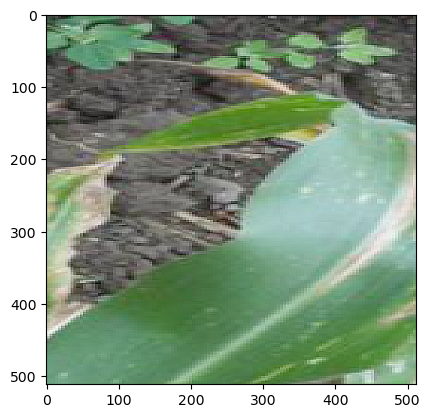

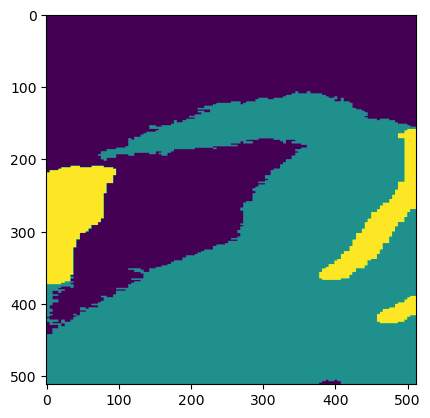

 70%|█████████████████████████████████████████████████████████▋                        | 57/81 [00:13<00:06,  3.96it/s]

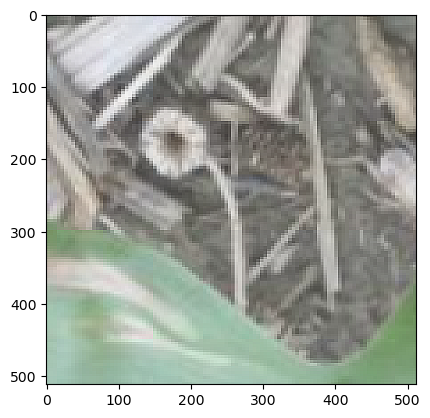

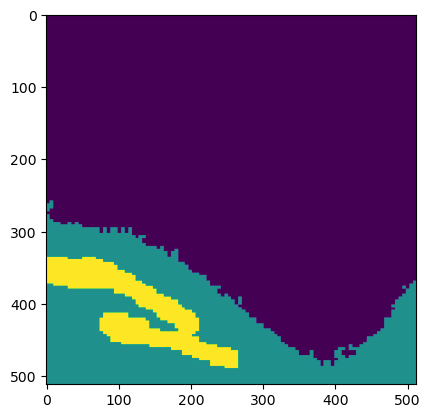

 72%|██████████████████████████████████████████████████████████▋                       | 58/81 [00:14<00:05,  3.97it/s]

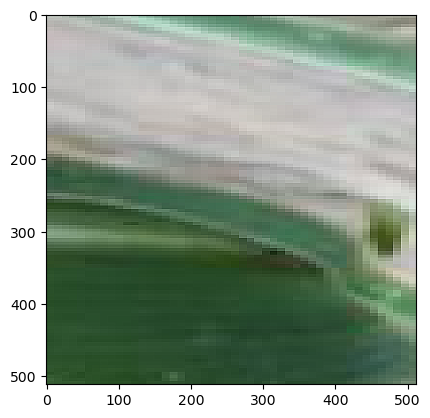

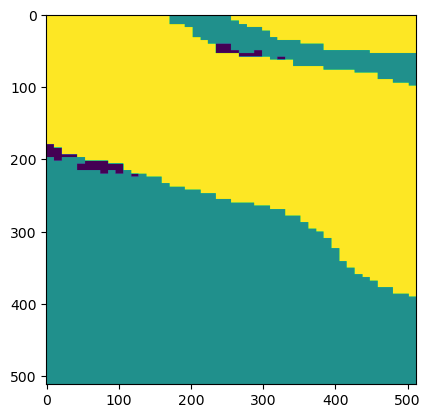

 73%|███████████████████████████████████████████████████████████▋                      | 59/81 [00:14<00:05,  4.21it/s]

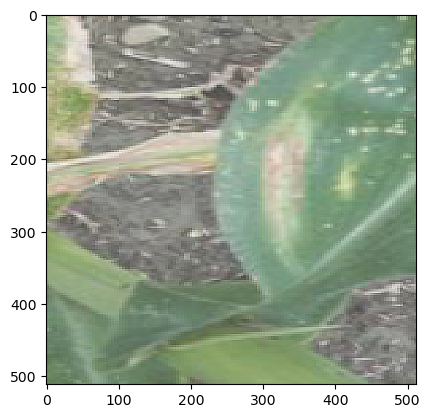

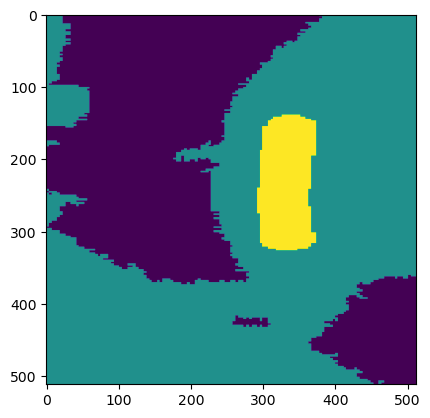

 74%|████████████████████████████████████████████████████████████▋                     | 60/81 [00:14<00:05,  4.06it/s]

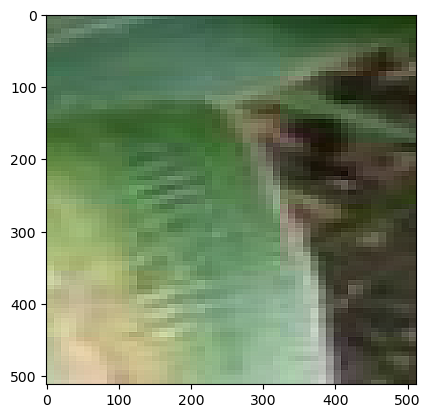

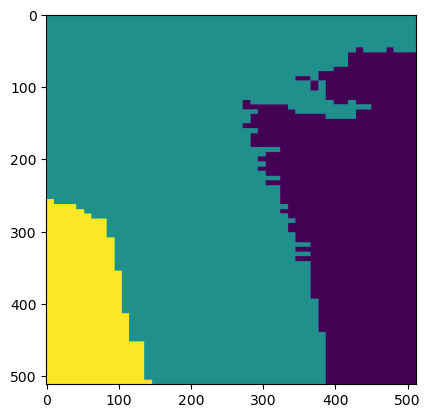

 75%|█████████████████████████████████████████████████████████████▊                    | 61/81 [00:14<00:04,  4.24it/s]

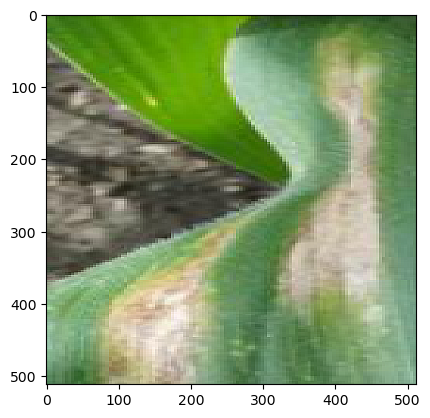

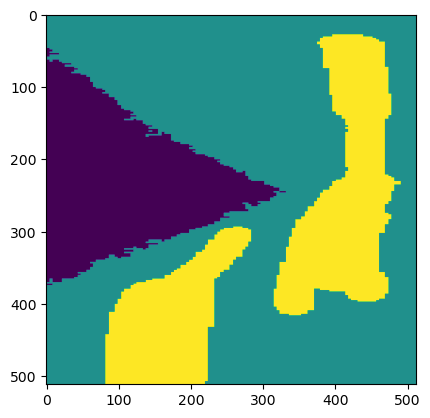

 77%|██████████████████████████████████████████████████████████████▊                   | 62/81 [00:14<00:04,  4.22it/s]

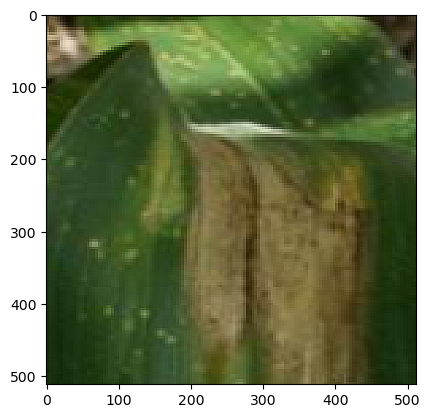

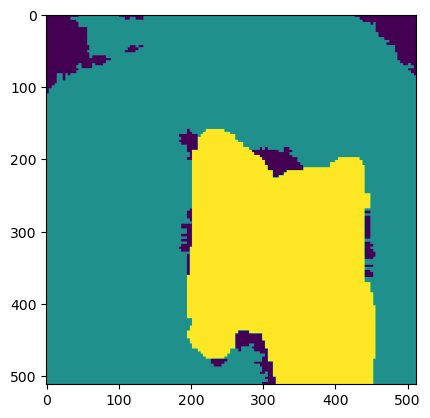

 78%|███████████████████████████████████████████████████████████████▊                  | 63/81 [00:15<00:04,  4.14it/s]

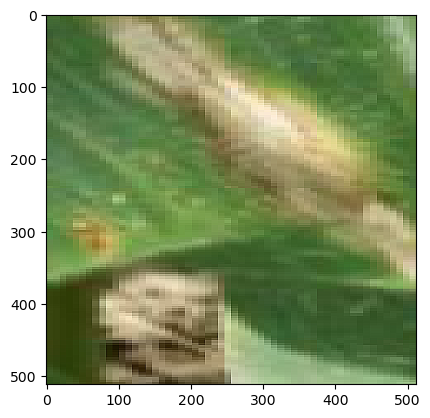

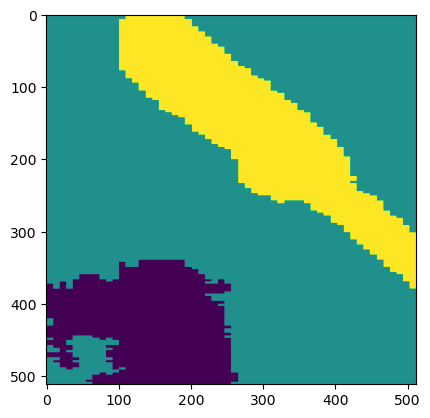

 79%|████████████████████████████████████████████████████████████████▊                 | 64/81 [00:15<00:04,  4.17it/s]

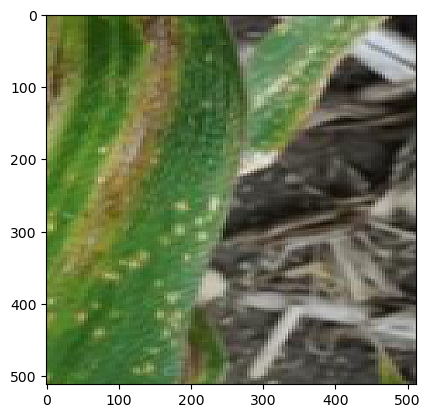

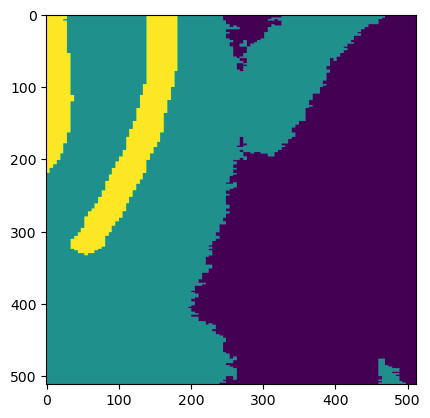

 80%|█████████████████████████████████████████████████████████████████▊                | 65/81 [00:15<00:04,  3.83it/s]

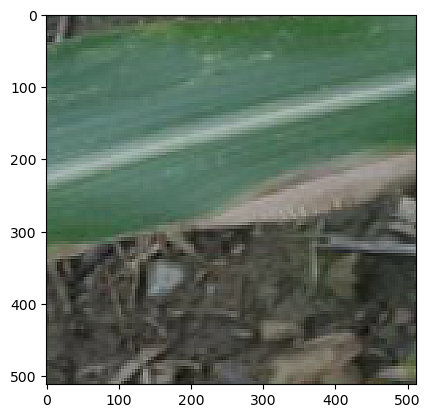

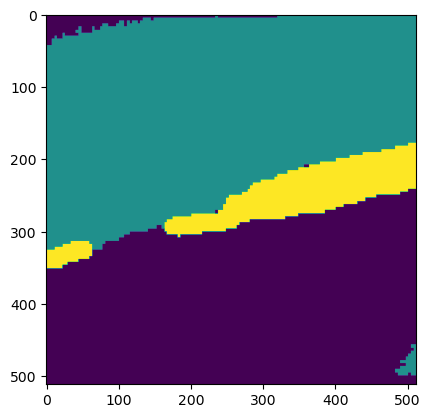

 81%|██████████████████████████████████████████████████████████████████▊               | 66/81 [00:16<00:03,  3.92it/s]

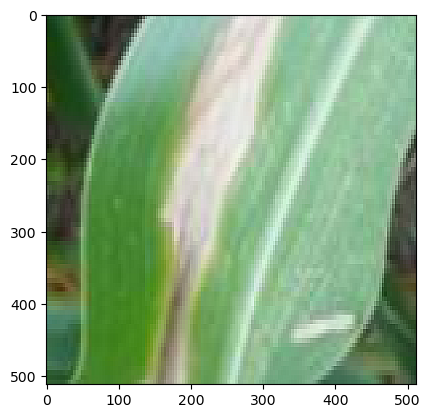

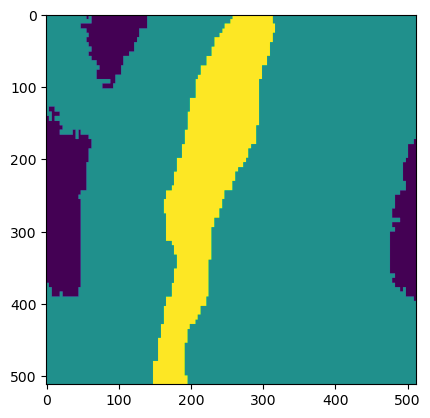

 83%|███████████████████████████████████████████████████████████████████▊              | 67/81 [00:16<00:03,  4.09it/s]

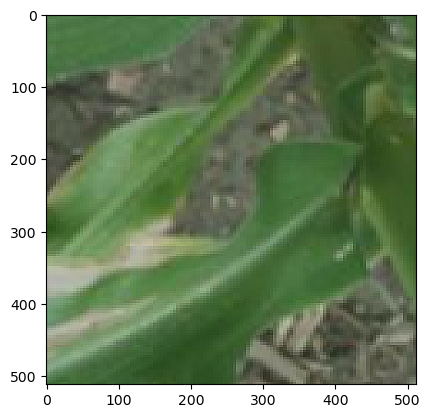

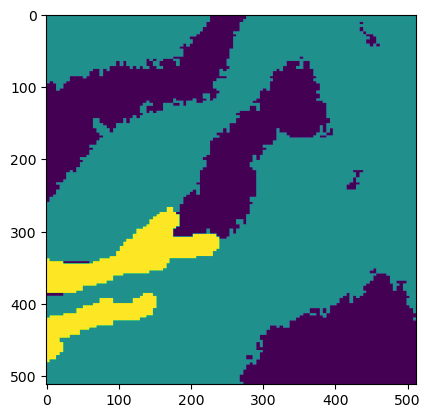

 84%|████████████████████████████████████████████████████████████████████▊             | 68/81 [00:16<00:03,  4.11it/s]

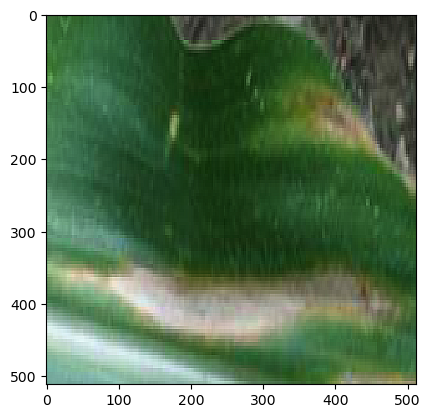

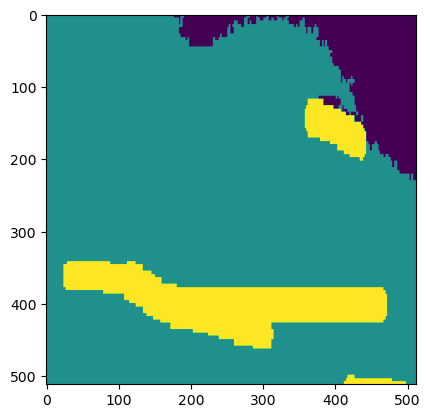

 85%|█████████████████████████████████████████████████████████████████████▊            | 69/81 [00:16<00:02,  4.12it/s]

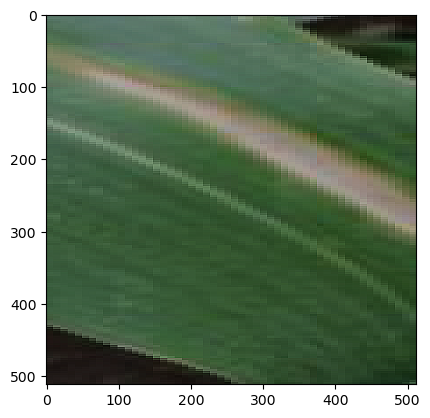

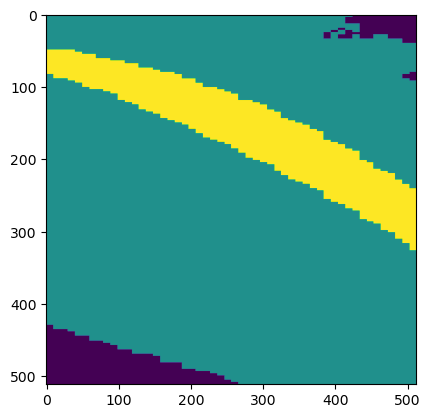

 86%|██████████████████████████████████████████████████████████████████████▊           | 70/81 [00:16<00:02,  4.21it/s]

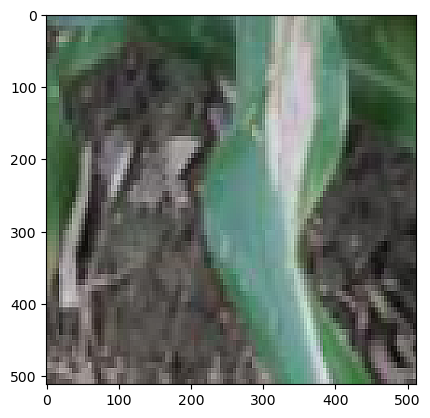

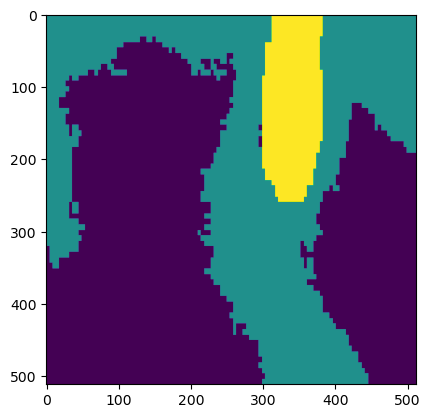

 88%|███████████████████████████████████████████████████████████████████████▉          | 71/81 [00:17<00:02,  4.36it/s]

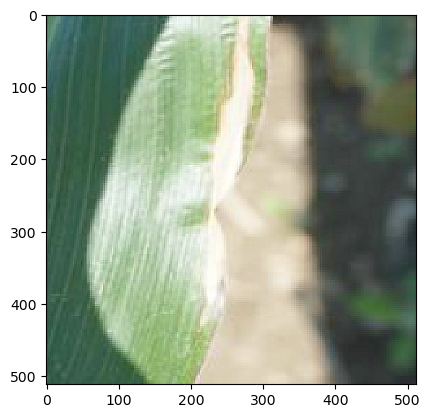

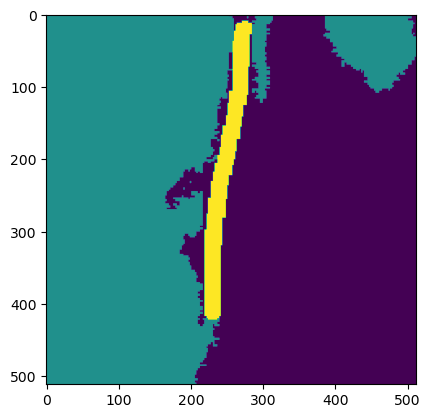

 89%|████████████████████████████████████████████████████████████████████████▉         | 72/81 [00:17<00:02,  4.16it/s]

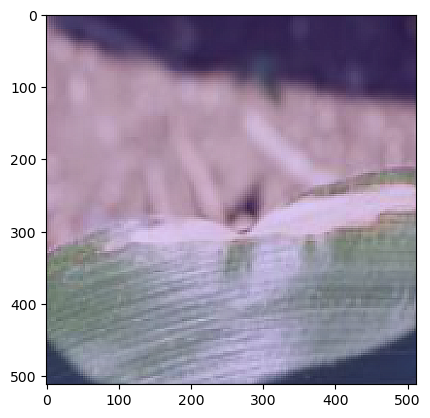

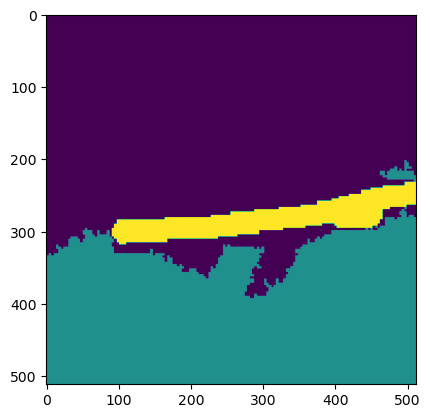

 90%|█████████████████████████████████████████████████████████████████████████▉        | 73/81 [00:17<00:01,  4.04it/s]

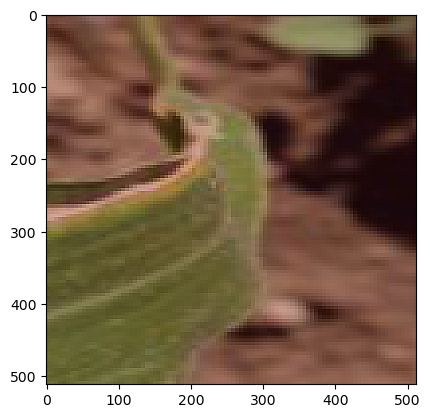

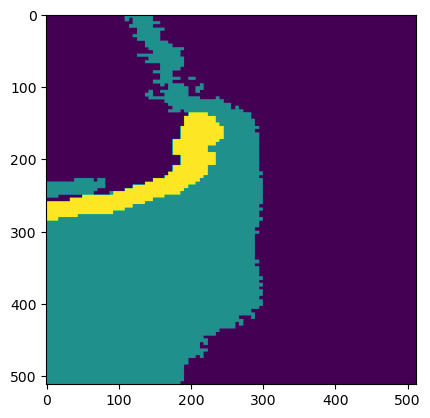

 91%|██████████████████████████████████████████████████████████████████████████▉       | 74/81 [00:17<00:01,  4.08it/s]

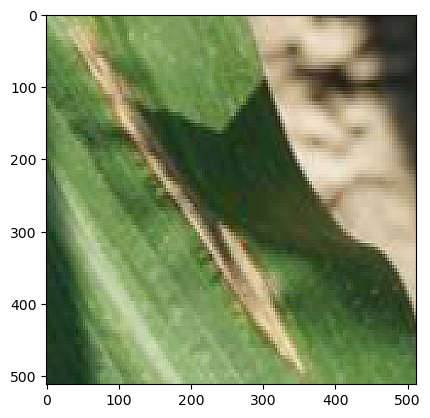

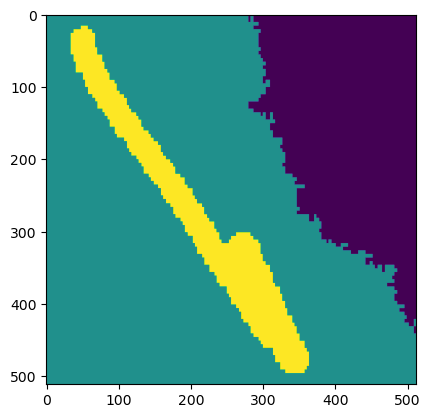

 93%|███████████████████████████████████████████████████████████████████████████▉      | 75/81 [00:18<00:01,  3.71it/s]

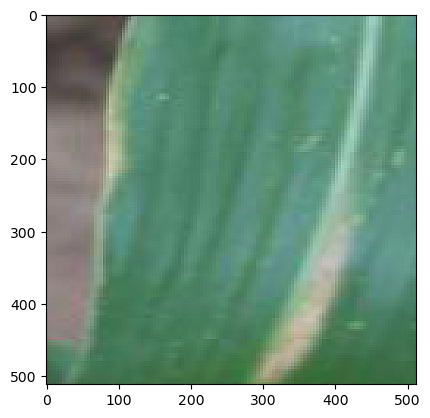

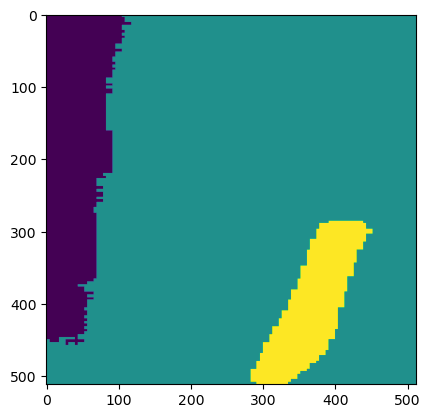

 94%|████████████████████████████████████████████████████████████████████████████▉     | 76/81 [00:18<00:01,  3.92it/s]

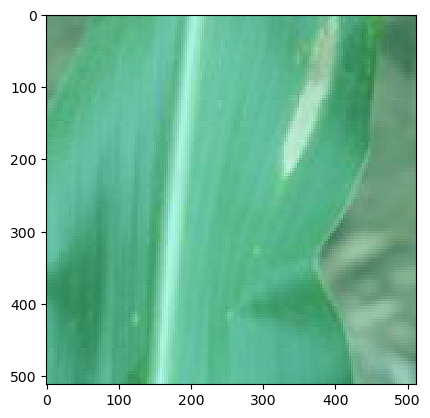

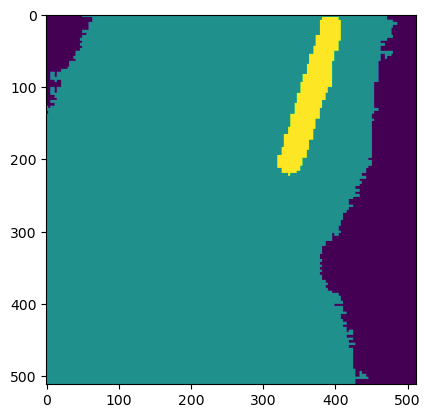

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 77/81 [00:18<00:01,  3.97it/s]

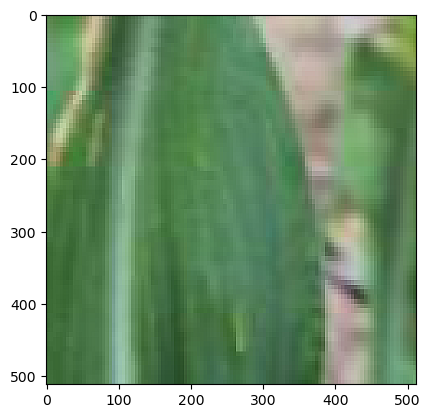

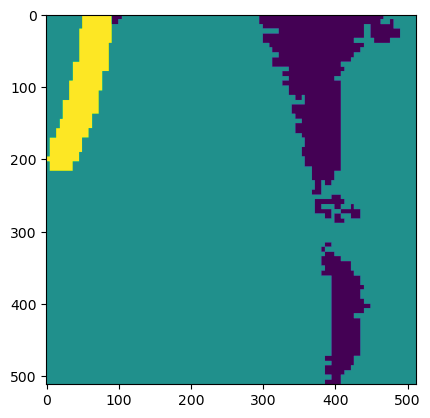

 96%|██████████████████████████████████████████████████████████████████████████████▉   | 78/81 [00:18<00:00,  4.13it/s]

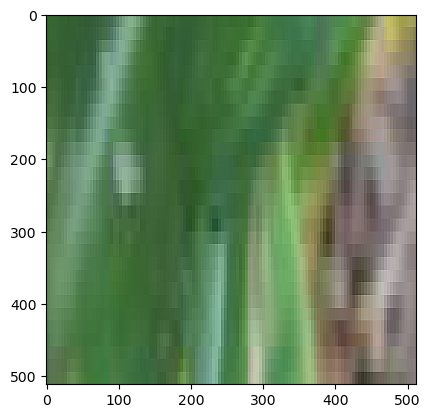

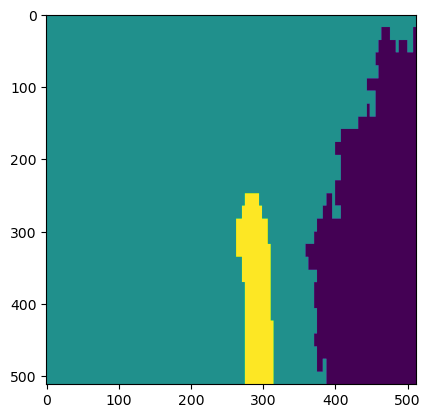

 98%|███████████████████████████████████████████████████████████████████████████████▉  | 79/81 [00:19<00:00,  4.39it/s]

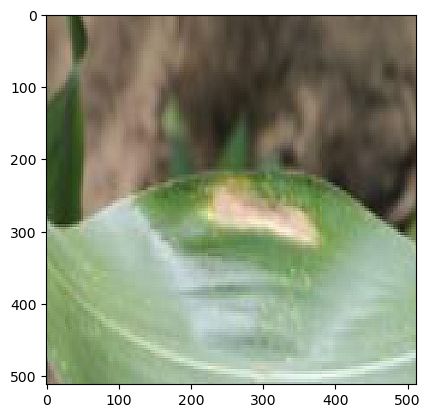

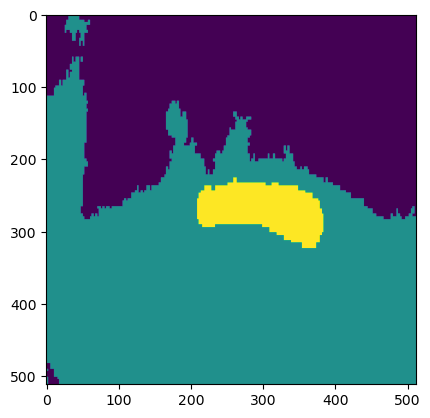

 99%|████████████████████████████████████████████████████████████████████████████████▉ | 80/81 [00:19<00:00,  4.37it/s]

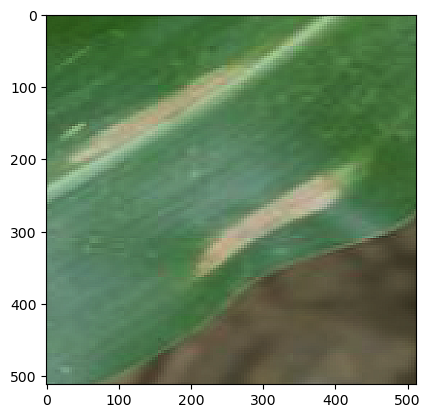

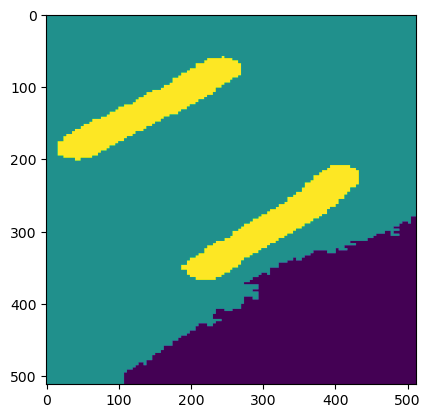

100%|██████████████████████████████████████████████████████████████████████████████████| 81/81 [00:19<00:00,  4.13it/s]


In [3]:
crop_images = []
crop_labels = []

for i, sample in enumerate(tqdm(train_dataset_it)):
    # -------------------------- student --------------------------
    image = sample['image']  # (N, 3, 512, 512)
    label = sample['label_all'].squeeze(1)  # (N, 512, 512)
    
    # get roi-cropped sets
    batch_size = image.shape[0]
    original_size = (image.shape[2], image.shape[3])

    for b in range(batch_size):
        # roi cropping
        image_crop_b, label_crop_b = crop_roi(image[b], label[b])

        # resize & sharpening
        image_crop_b = nn.functional.interpolate(image_crop_b.unsqueeze(0).float(), size=original_size,
                                                 mode='nearest')
        image_crop_b = F.adjust_sharpness(image_crop_b, 5.0)

        label_crop_b = nn.functional.interpolate(label_crop_b.unsqueeze(0).unsqueeze(1).float(),
                                                 size=original_size, mode='nearest').squeeze(1)
        if b == 0:
            image_aug = image_crop_b
            label_aug = label_crop_b
            del image_crop_b, label_crop_b
        else:
            image_aug = torch.cat([image_aug, image_crop_b], dim=0)
            label_aug = torch.cat([label_aug, label_crop_b], dim=0)
            del image_crop_b, label_crop_b
            
    plt.imshow(image_aug[0].permute(1,2,0))
    plt.show()        
    plt.imshow(label_aug[0])
    plt.show()
    

In [83]:
batch_size = image.shape[0]
original_size = (image.shape[2], image.shape[3])

for b in range(batch_size):
    # roi cropping
    image_crop, label_crop = crop_roi(image[b], label[b])

    # resize & sharpening
    image_crop = nn.functional.interpolate(image_crop.unsqueeze(0).float(), size=original_size,
                                            mode='nearest')
    image_crop = F.adjust_sharpness(image_crop, 5.0)

    label_crop = nn.functional.interpolate(label_crop.unsqueeze(0).unsqueeze(1).float(),
                                            size=original_size, mode='nearest').squeeze(1)
    
    if b == 0:
        image_aug = image_crop
        label_aug = label_crop
    else:
        image_aug = torch.cat([image_aug, image_crop], dim=0)
        label_aug = torch.cat([label_aug, label_crop], dim=0)
    

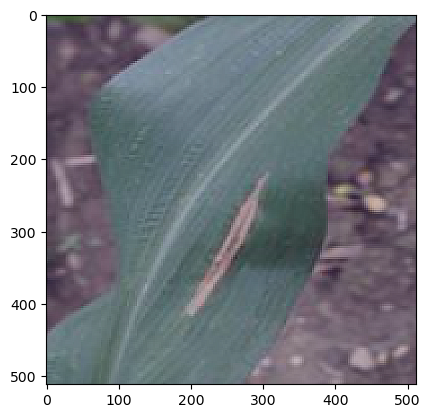

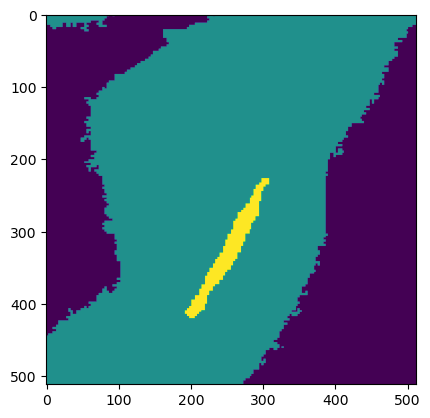

In [69]:
b = 0

plt.imshow(image_aug[b].permute(1,2,0))
plt.show()
plt.imshow(label_aug[b])
plt.show()